In [1]:
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torchvision
from torchvision import datasets, transforms

from tqdm import tqdm

In [2]:
# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
# Hyper-Parameters
BATCH_SIZE = 64
LATENT_DIM = 256
LEARNING_RATE = 0.005
BETA1 = 0.5
BETA2 = 0.99
NUM_EPOCHS = 250

### Data Preprocessing

In [4]:
# Image transform
transform = transforms.Compose(
    [transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]
)

In [5]:
# Dataset
dataset = datasets.CIFAR10(
    root="./data",
    train=True,
    download=True,
    transform=transform,
)

Files already downloaded and verified


In [6]:
# Testing Subset

from torch.utils.data import Subset
import random

# Define the desired number of samples
desired_size = 2500

# Generate random indices for the subset
random.seed(42)  # Set seed for reproducibility
indices = random.sample(range(len(dataset)), desired_size)

# Create a subset of the dataset
dataset = Subset(dataset, indices)

In [7]:
# Dataloader
dataloader = torch.utils.data.DataLoader(
    dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
)

### Generator

In [8]:
class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()

        # Define the generator model as a sequential network
        self.model = nn.Sequential(
            # Project latent vector to initial feature map
            nn.Linear(latent_dim, 128 * 8 * 8),
            nn.ReLU(inplace=True),

            # Reshape to (128, 8, 8)
            nn.Unflatten(1, (128, 8, 8)),

            # First upsampling block
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128, momentum=0.8),
            nn.ReLU(inplace=True),

            # Second upsampling block
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64, momentum=0.8),
            nn.ReLU(inplace=True),

            # Output block (RGB image)
            nn.Conv2d(64, 3, kernel_size=3, stride=1, padding=1),
            nn.Tanh()  # Output range: [-1, 1]
        )

    def forward(self, x):
        return self.model(x)

### Discriminator

In [9]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        # Define the discriminator model as a sequential network
        self.model = nn.Sequential(
            # Input block (RGB image)
            nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Downsampling block 1
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128, momentum=0.8),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Downsampling block 2
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256, momentum=0.8),
            nn.LeakyReLU(0.2, inplace=True),
            
            # # Downsampling block 3
            # nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
            # nn.BatchNorm2d(512, momentum=0.8),
            # nn.LeakyReLU(0.2, inplace=True),

            # Flatten and output
            nn.Flatten(),
            nn.Linear(256 * 4 * 4, 1),
            nn.Sigmoid()  # Output range: [0, 1]
        )

    def forward(self, x):
        return self.model(x)

### Training

In [10]:
# Instantiate the Generator and Discriminator models
generator = Generator(LATENT_DIM)
discriminator = Discriminator()

# Define the adversarial loss function (Binary Cross-Entropy Loss)
adversial_loss = nn.BCELoss()

# Optimizer for the Generator
G_optimizer = torch.optim.Adam(
    generator.parameters(),
    lr=LEARNING_RATE,
    betas=(BETA1, BETA2),
)

# Optimizer for the Discriminator
D_optimizer = torch.optim.Adam(
    discriminator.parameters(),
    lr=LEARNING_RATE,
    betas=(BETA1, BETA2),
)

In [11]:
# Checkpoint


# Save model function
def save_checkpoint(
    epoch, generator, discriminator, G_optimizer, D_optimizer, filename="checkpoint.pth"
):
    torch.save(
        {
            "epoch": epoch + 1,
            "generator_state_dict": generator.state_dict(),
            "discriminator_state_dict": discriminator.state_dict(),
            "G_optimizer_state_dict": G_optimizer.state_dict(),
            "D_optimizer_state_dict": D_optimizer.state_dict(),
        },
        filename,
    )


# Load model function
def load_checkpoint(generator, discriminator, G_optimizer, D_optimizer, filename):
    checkpoint = torch.load(filename)

    start_epoch = checkpoint["epoch"]
    generator.load_state_dict(checkpoint["generator_state_dict"])
    discriminator.load_state_dict(checkpoint["discriminator_state_dict"])
    G_optimizer.load_state_dict(checkpoint["G_optimizer_state_dict"])
    D_optimizer.load_state_dict(checkpoint["D_optimizer_state_dict"])

    return start_epoch

In [12]:
# Load model
try:
    start_epoch = load_checkpoint(
        generator, discriminator, G_optimizer, D_optimizer, filename="checkpoint.pth"
    )
    print(f"Resuming training from epoch: {start_epoch}")
except FileNotFoundError:
    start_epoch = 1
    print(f"No checkpoint found, starting training from scratch...")

No checkpoint found, starting training from scratch...


C:\Users\aks7d\AppData\Local\Temp\ipykernel_20732\3994662188.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(filename)


In [13]:
# Train discriminator
def train_discriminator(discriminator, generator, real_images, D_optimizer):

    # Reset Gradients
    D_optimizer.zero_grad()

    # Real Image Loss
    real_labels = torch.ones(real_images.size(0), 1)
    real_pred = discriminator(real_images)
    real_loss = adversial_loss(real_pred, real_labels)

    # Fake Image Loss
    noise = torch.randn(real_images.size(0), LATENT_DIM)
    fake_images = generator(noise)

    fake_labels = torch.zeros(real_images.size(0), 1)
    fake_pred = discriminator(fake_images.detach())
    fake_loss = adversial_loss(fake_pred, fake_labels)

    # Total Loss
    d_loss = (real_loss + fake_loss) / 2
    d_loss.backward()

    D_optimizer.step()

    return d_loss.item()

In [14]:
# Train generator
def train_generator(discriminator, generator, G_optimizer):

    # Reset Gradients
    G_optimizer.zero_grad()

    # Generate Fake Images & Calculate Loss
    noise = torch.randn(BATCH_SIZE, LATENT_DIM)

    fake_images = generator(noise)
    real_labels = torch.ones(BATCH_SIZE, 1)

    g_pred = discriminator(fake_images)
    g_loss = adversial_loss(g_pred, real_labels)
    g_loss.backward()

    G_optimizer.step()

    return g_loss.item()

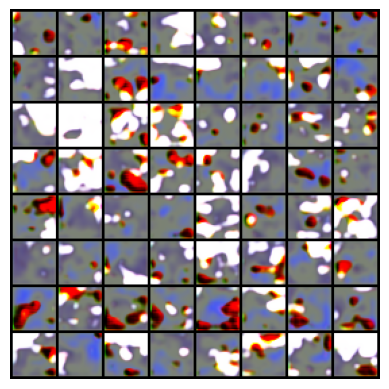

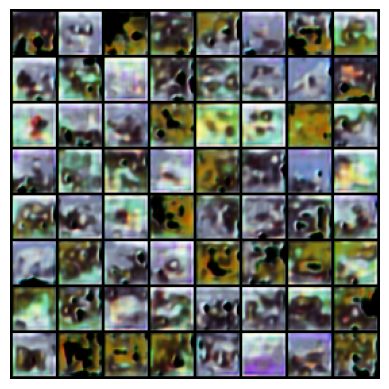

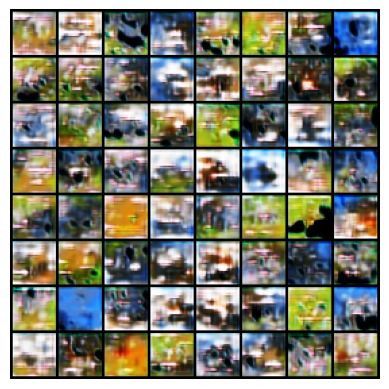

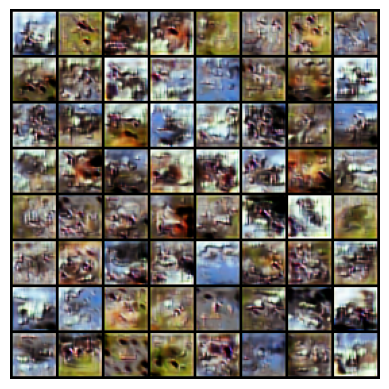

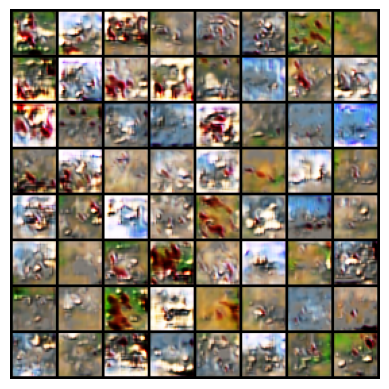

...

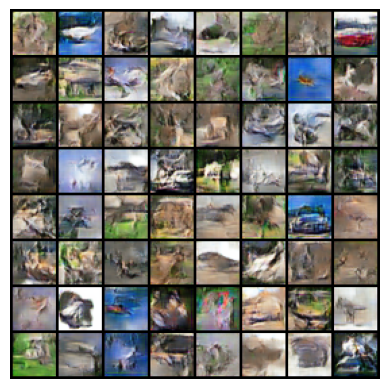

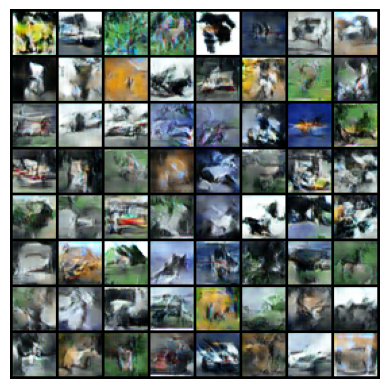

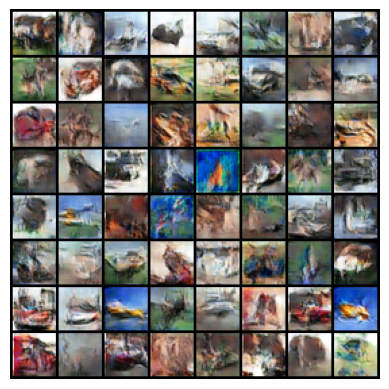

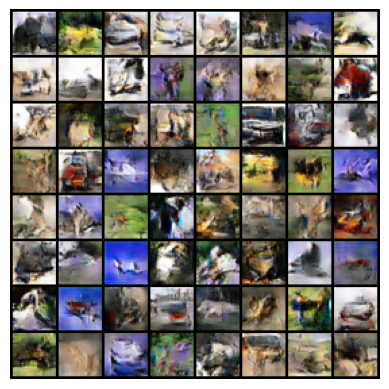

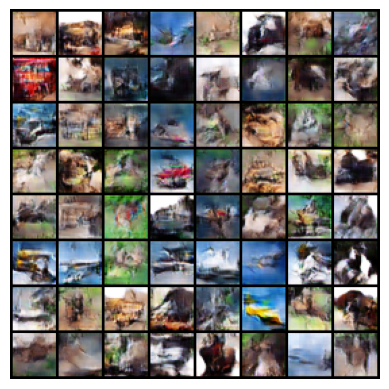

In [15]:
# Set both Generator and Discriminator to training mode
generator.train()
discriminator.train()

for epoch in range(start_epoch, NUM_EPOCHS):

    for i, batch in enumerate(dataloader):
        real_images = batch[0]  # Extract real images from the batch

        # Train the Discriminator with real and generated images
        d_loss = train_discriminator(discriminator, generator, real_images, D_optimizer)

        # Train the Generator to produce better fake images
        g_loss = train_generator(discriminator, generator, G_optimizer)

        # Clear unused memory to optimize GPU usage
        torch.cuda.empty_cache()

    save_checkpoint(epoch, generator, discriminator, G_optimizer, D_optimizer)

    # Visualize generated images every epoch
    if (epoch + 1) % 5 == 0:
        with torch.no_grad():
            noise = torch.randn(BATCH_SIZE, LATENT_DIM)
            generated_images = generator(noise).detach().cpu()

            grid = torchvision.utils.make_grid(generated_images, nrow=8, normalize=True)
            plt.imshow(grid.permute(1, 2, 0))
            plt.axis("off")
            plt.show()